# Shock Analysis

In [2]:
# %pwd

In [3]:
%cd /Users/lightning/repo/Economic_Networks

/Users/lightning/repo/Economic_Networks


In [4]:
from econnet import data

In [5]:
## we got 4 tables;

## issue -- model
## task for presentation
##

### Statistics -- 
## historic data 
## model comparison -- stat

# import abc
# import json
# import numpy as np
# import pandas as pd
# import networkx as nx

##
## play
## nice visuals
## examples metals --> see how propagation
## intuion check
## 

In [6]:
## simulator.py

/Users/lightning/opt/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0.5, 1.0, 'Delta-function shock effects (relative)')

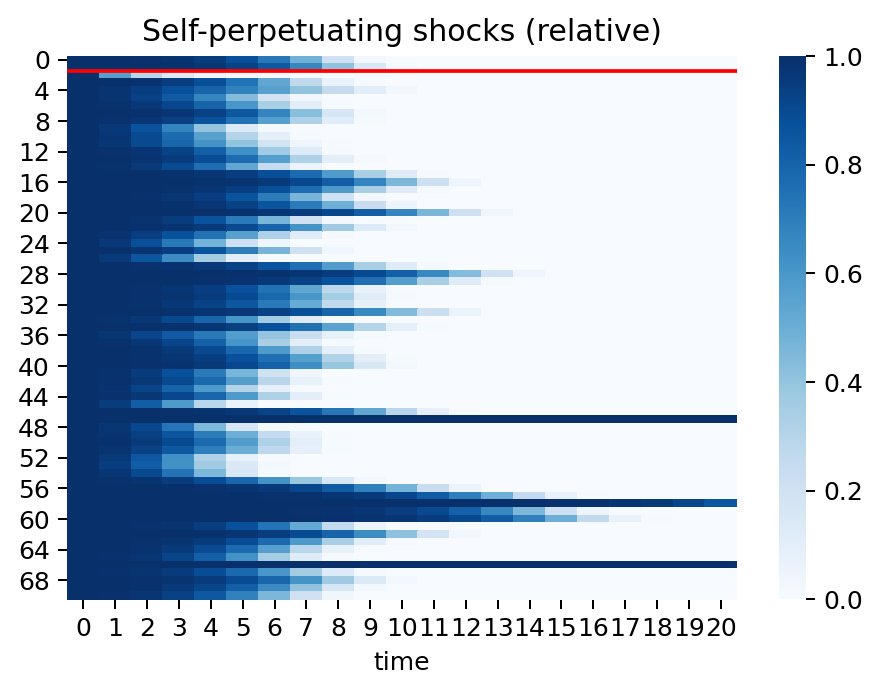

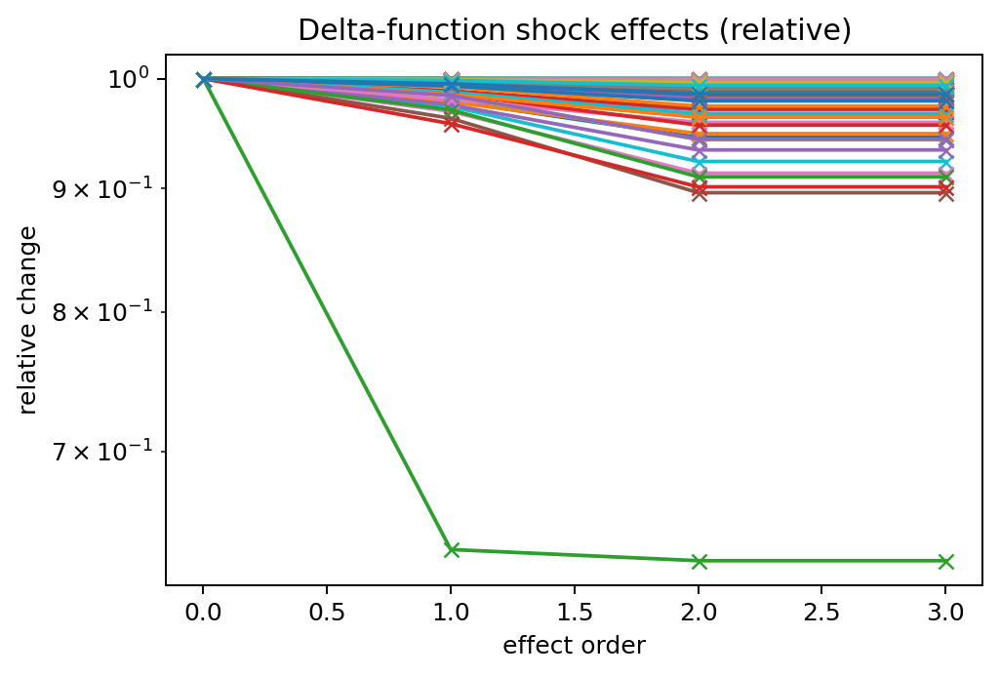

In [51]:
from econnet import simulator

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from econnet import data


# naive implementation for testing purposes, keep propagating self-effects
def simulateAll(y, H, dz, niter=20):
    """Self-perpetuating perturbation"""
    ys = [y]

    for i in range(niter):
        dly = H @ dz
        y = np.exp(np.log(y) + dly)
        ys.append(y)

        # the previous effect becomes the shock
        dz = dly

    return ys


def simulateOneTime(y, H, dz, niter=20):
    """One-time shock
       The iterations correspond to the ORDER of perturbation effects"""

    ys = [y]
    seen = set()

    for i in range(niter):
        dly = H @ dz
        y = np.exp(np.log(y) + dly)
        ys.append(y)

        # TODO: use an eps cutoff instead of strict 0?
        # the shock propagates downstream
        seen.update([i for i in np.where(dz)[0]])

        if len(seen) == len(y):
            break
        if sum(dly) == 0:
            break

        # only set the ones that were perturbed for the first time
        # as the new perturbation
        dz = np.zeros(dz.shape)
        mask = sorted(set(range(len(y))) - seen)
        dz[mask] = dly[mask]

    return ys


# TODO: producer vs industry prices fields?
# initial state - using VALUE ADDED
year = 2020
u = data.Use(year)
y = u.table.loc["Value Added (producer prices)", :][:data.Table.nInd]
ys = []

H = data.I2IReqs(year).make_adjacency()

dz = np.zeros(y.shape[0])
# dz[np.random.randint(0, y.shape[0])] = - np.random.rand()
# let's shock housing - it doesn't make sense to shock more than exp(-0.5)
# = 40% decrease
# dz[48] = - np.random.uniform(0, 0.5)

# "Oil & Gas"
# dz[2] = - np.random.uniform(0, 0.5)
dz[2] = -.4

all_run = simulator.simulateAll(y=y, H=H, dz=dz)
ar = np.array(all_run)

#NOTE: Housing -index 48 - is upstream from real estate and unaffected!!!
sns.heatmap((ar / ar[0, :]).T, cmap="Blues")
plt.xlabel("time")
plt.axhline(np.where(dz), color="red")
plt.title("Self-perpetuating shocks (relative)")

# Delta function shock
one_run = simulateOneTime(y=y, H=H, dz=dz)
oar = np.array(one_run)

plt.figure()
plt.plot(oar / oar[0, :], marker="x")
plt.xlabel("effect order")
plt.ylabel("relative change")
plt.yscale('log')
plt.title("Delta-function shock effects (relative)")


In [8]:
industry_names = data.pd.Series(data.Table.industries)

name = "Oil & Gas"
name = "Funds & trusts"
temp = np.where(industry_names == name)
int(temp[0])

46

We are shocking: Funds & trusts


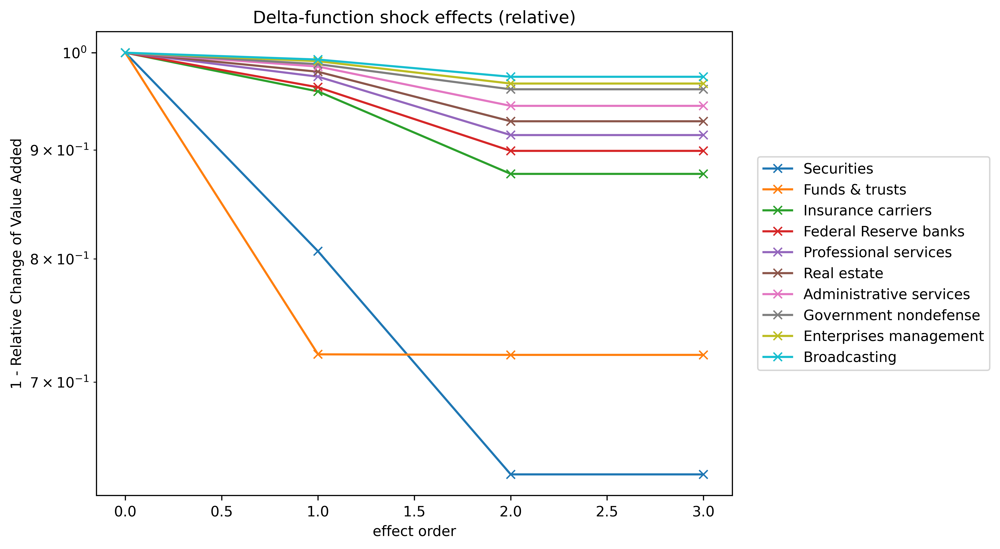

In [9]:
def get_min_elements_index(array, n):
    array_sort = np.sort(array)
    array_sort = array_sort[:n]
    ##
    index_min_elements = []
    for small_thing in array_sort:
        index_small = np.where( array == small_thing)
        index_small = int(index_small[0])
        index_min_elements.append(index_small)
        
    return index_min_elements

# get_min_elements_index(arr, 3)


## this code is for experimenting
industry_names = data.pd.Series(data.Table.industries)

def plot_experiment(name="Funds & trusts", n=10, shock = -.3, year = 2020, dz = 0):
    
    temp = np.where(industry_names == name)
    index_name = int(temp[0])
    print(f'We are shocking: {name}')
    
    ## define the background var's
    u = data.Use(year)
    y = u.table.loc["Value Added (producer prices)", :][:data.Table.nInd]
    ys = []
    H = data.I2IReqs(year).make_adjacency()
    dz = np.zeros(y.shape[0])

    ## "Eletronics"
    # dz[12] = -.3

    dz[index_name] = shock
    ##
    ## Delta function shock
    one_run = simulateOneTime(y=y, H=H, dz=dz)
    oar = np.array(one_run)

    ##

    shock_effs_relative = oar / oar[0, :]
    shock_effs_relative = pd.DataFrame(shock_effs_relative)
    shock_effs_relative.columns = industry_names

    ## base on the last order, get the most effected industries
    index_most_effected = get_min_elements_index(shock_effs_relative.iloc[-1,:], n=n)


    plt.figure(figsize=(8,6), dpi = 600)
    plt.plot(shock_effs_relative, marker="x")
    plt.xlabel("effect order")
    plt.ylabel("1 - Relative Change of Value Added")
    plt.yscale('log')
    plt.title("Delta-function shock effects (relative)")
#     plt.show()
    plt.close()

    
    plt.figure(figsize=(8,6), dpi = 600)
    plt.plot(shock_effs_relative.iloc[:,index_most_effected], marker="x")
    plt.xlabel("effect order")
    plt.ylabel("1 - Relative Change of Value Added")
#     plt.ylabel("Fraction of Inital Value")
    plt.yscale('log')
    plt.title("Delta-function shock effects (relative)")
    ## make the legend outside left
    plt.legend(shock_effs_relative.columns[index_most_effected], bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.show()
    

plot_experiment()


We are shocking: Oil & Gas


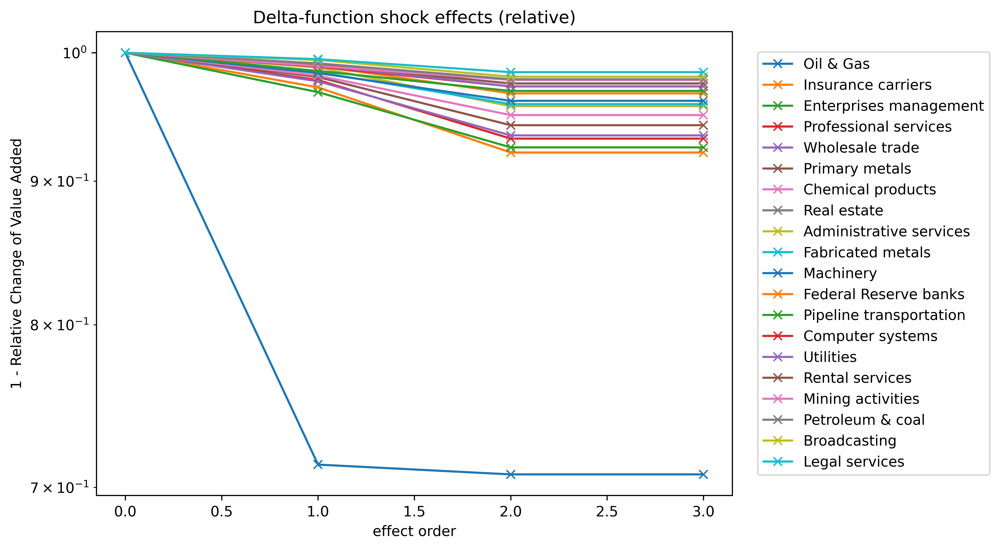

In [10]:
plot_experiment(name = "Oil & Gas", n=20)

In [11]:
r = data.I2IReqs()
r.table.loc["Electronics", "Electronics"]
r.table.loc["Electronics", "Wholesale trade"]
r.table.columns

Index(['Farms', 'Forestry', 'Oil & Gas', 'Mining', 'Mining activities',
       'Utilities', 'Construction', 'Wood', 'Nonmetallic minerals',
       'Primary metals', 'Fabricated metals', 'Machinery', 'Electronics',
       'Electrical equipments', 'Motor Vehicles', 'Transportation equipment',
       'Furnitures', 'Misc. Manufacturing', 'Food products', 'Textile mills',
       'Apparel', 'Paper', 'Printing', 'Petroleum & coal', 'Chemical products',
       'Plastics & Rubber', 'Wholesale trade', 'Vehicle dealers',
       'Food stores', 'Merchandise stores', 'Other retail',
       'Air transportation', 'Rail transportation', 'Water transportation',
       'Truck transportation', 'Ground transportation',
       'Pipeline transportation', 'Other transportation',
       'Warehousing & storage', 'Publishing industries', 'Motion picture',
       'Broadcasting', 'Information services', 'Federal Reserve banks',
       'Securities', 'Insurance carriers', 'Funds & trusts', 'Housing',
       'Real es

In the future, I will compare how stock prices reacts to shock vs how industries react to shocks. 

* 2 plots side to side
* there is not time in our modeling plots, only order of magnitude 

In [12]:
# for name in industry_names:
#     plot_experiment(name)

In [13]:
type(industry_names)

pandas.core.series.Series

In [14]:
import os
os.system('say "your program has finished"')

0

Interesting ones:
    
* We are shocking: Food products -- big magnitude
* We are shocking: Petroleum & coal -- switch
* We are shocking: Plastics & Rubber
* We are shocking: Funds & trusts
    







We are shocking: Food products


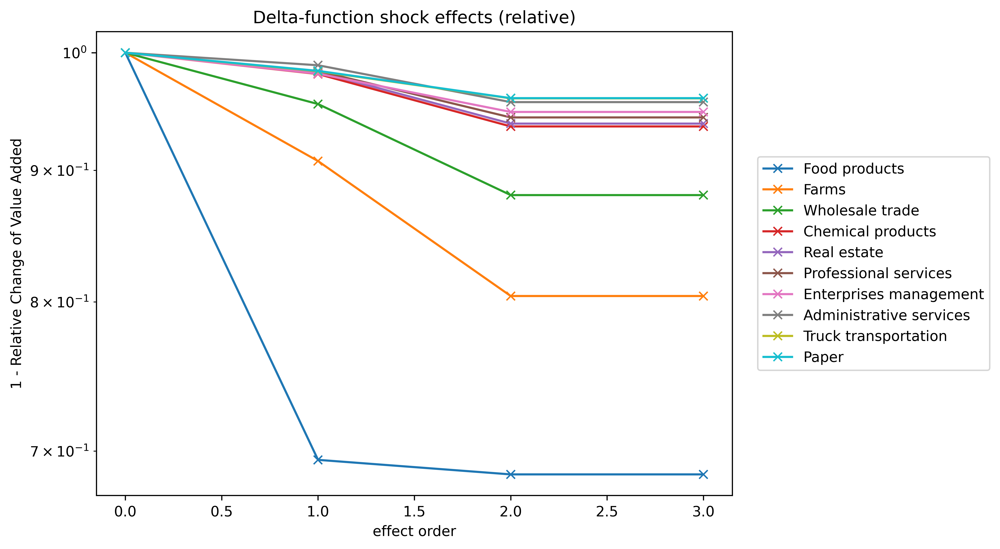

In [15]:
plot_experiment('Food products')

We are shocking: Food products


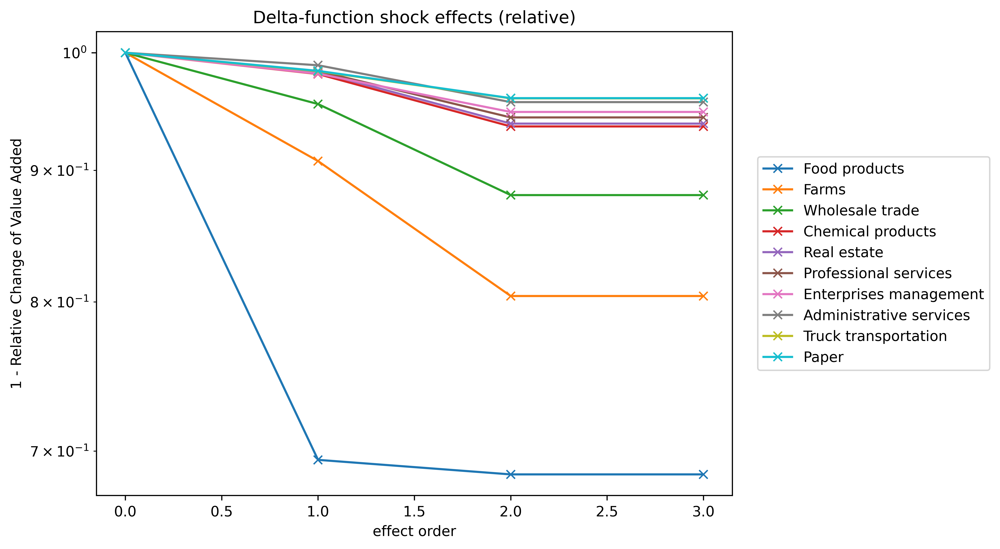

We are shocking: Petroleum & coal


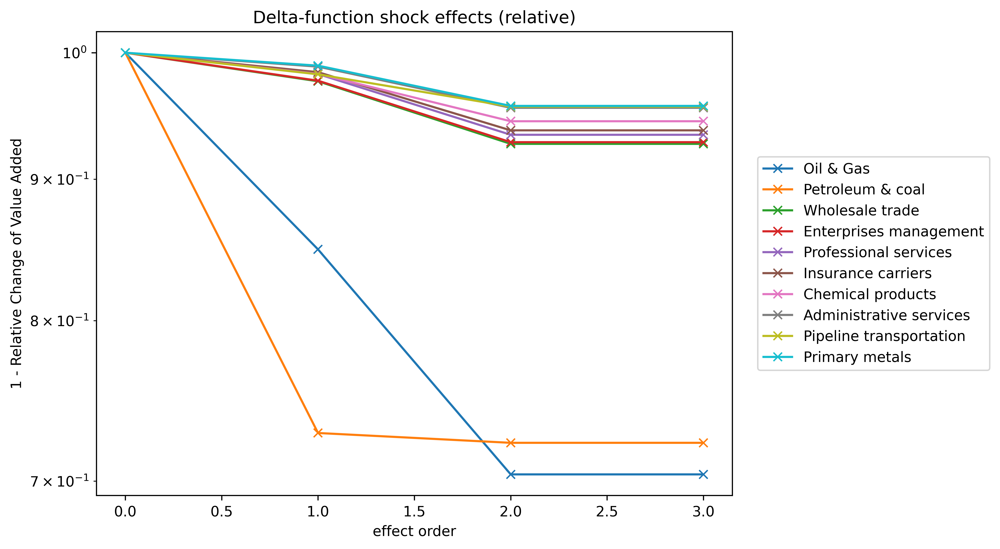

We are shocking: Oil & Gas


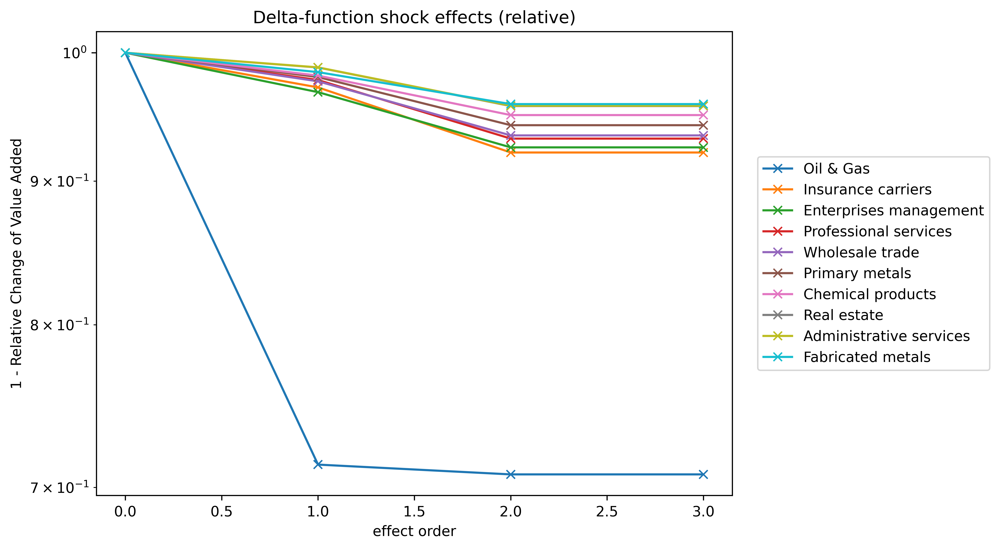

We are shocking: Plastics & Rubber


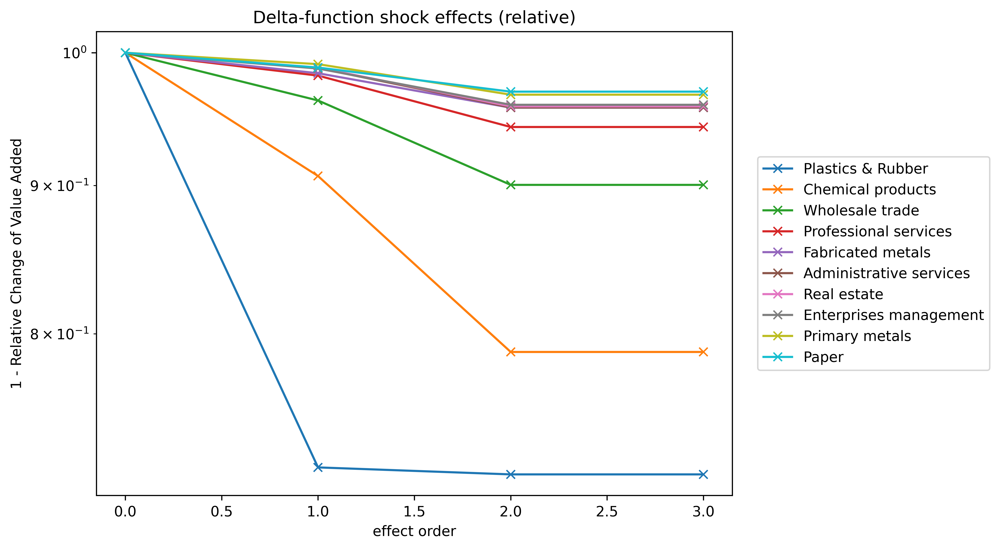

We are shocking: Funds & trusts


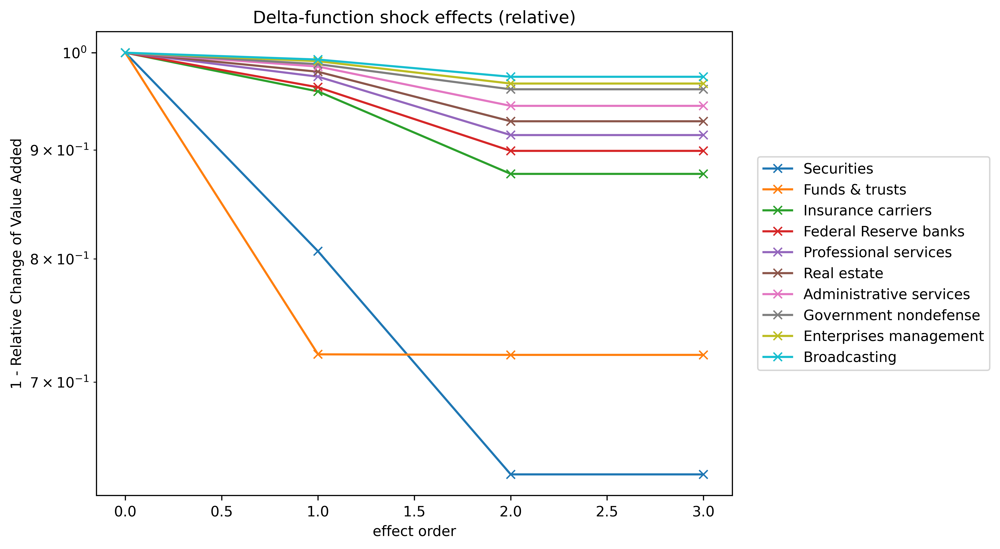

In [16]:
interesting_industries = ['Food products', 
                          'Petroleum & coal', 
                          'Oil & Gas', 
                          'Plastics & Rubber', 
                          'Funds & trusts']
for industry in interesting_industries:
    plot_experiment(industry)

We are shocking: Petroleum & coal


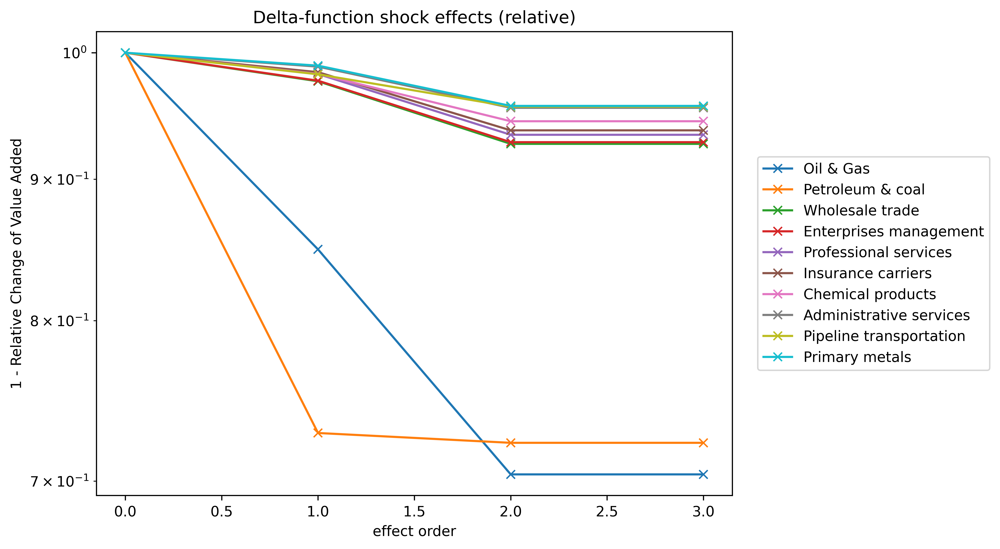

We are shocking: Oil & Gas


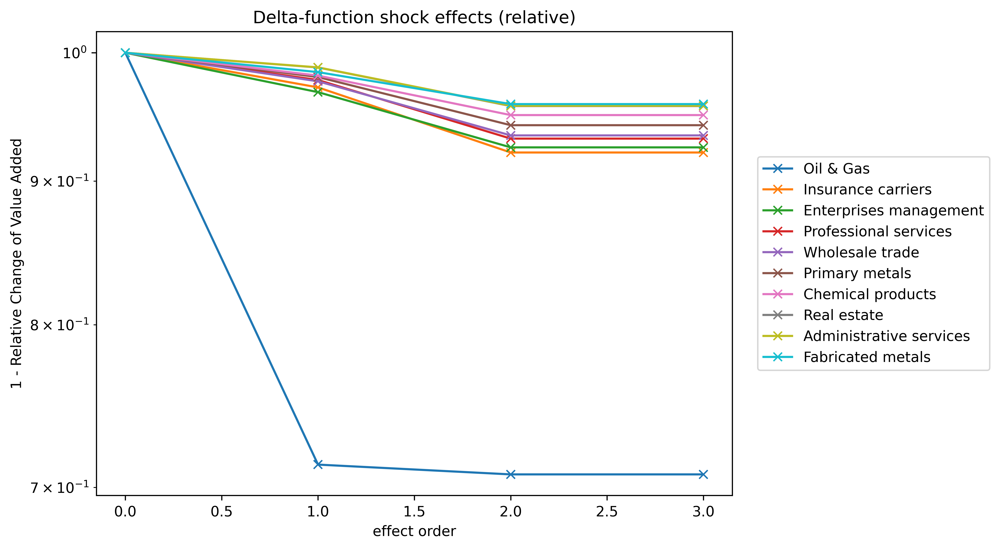

We are shocking: Funds & trusts


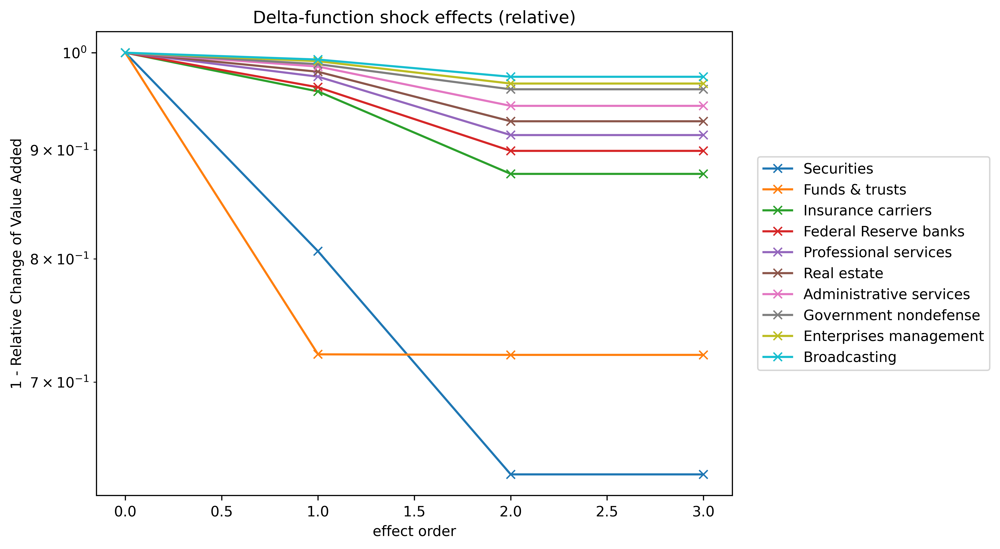

We are shocking: Wood


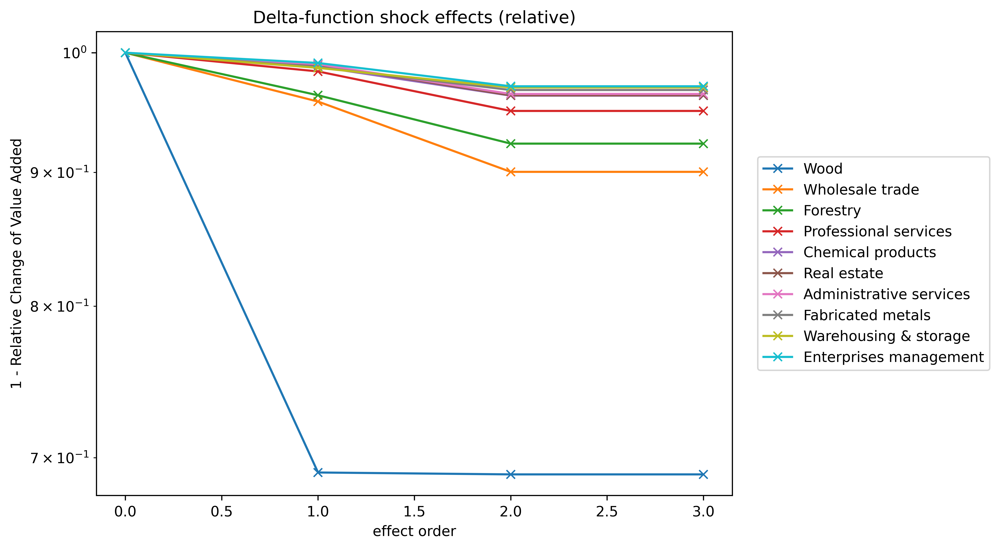

In [17]:
interesting_industries = [
                          'Petroleum & coal', 
                          'Oil & Gas', 
                          'Funds & trusts',
                          'Wood']

for industry in interesting_industries:
    plot_experiment(industry)
    

We are shocking: Housing


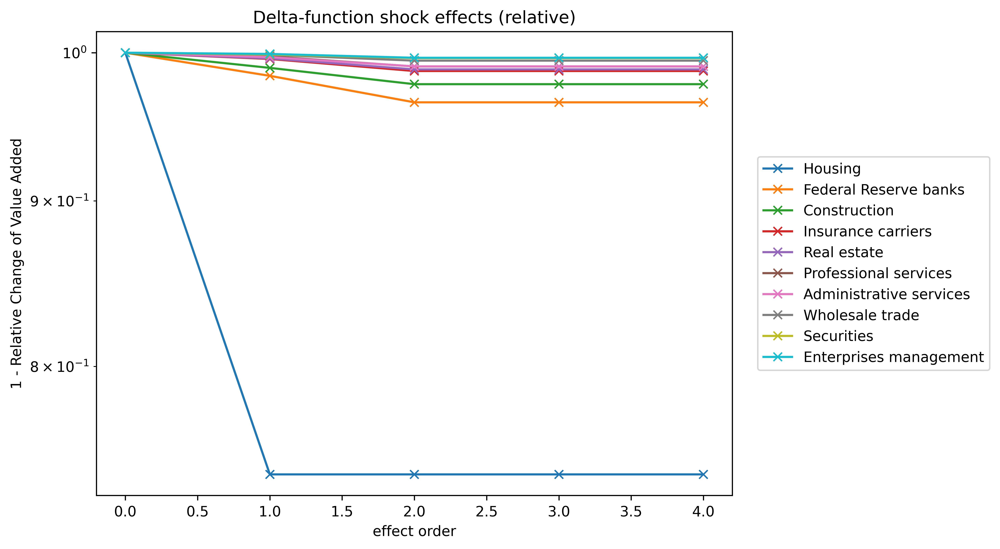

In [18]:
plot_experiment('Housing')

# BEA Data to calibrate dz

/Users/lightning/repo/Economic_Networks


In [20]:
import IPython
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib
import sklearn
import seaborn as sns

%matplotlib inline  
import matplotlib.pyplot as plt  
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.formula.api as smf

# %%script false 
# --no-raise-error

%cd /Users/lightning/repo/Economic_Networks

$$Q_{i+1} - Q_{i}$$

In [22]:
import pandas as pd

## Unnamed: 1	2019	2019.1	2019.2	2019.3	2020	2020.1	2020.2	2020.3	2021	2021.1	2021.2	2021.3

filePath = "notebooks/tzu-data/va-quarter.csv"
# filePath = "tzu-data/va-quarter.csv"
df_va_qtr = pd.read_csv(filePath, skiprows = 5).iloc[:100,1:]
df_va_qtr

df_q1_q4 = df_va_qtr[ ['Q1', 'Q2', 'Q3', 'Q4'] ]

df_q1_q4 = df_q1_q4.apply(pd.to_numeric, errors='coerce')


df_difference = pd.DataFrame()
df_difference["diff_q2q1"] = df_q1_q4.Q2 - df_q1_q4.Q1
df_difference["diff_q3q2"] = df_q1_q4.Q3 - df_q1_q4.Q2
df_difference["diff_q4q3"] = df_q1_q4.Q4 - df_q1_q4.Q3
df_difference.index = df_va_qtr.iloc[:,0]
##
## this is the max magnitude relative change;
index_max_shock = df_difference.apply(np.argmax, axis=1)
max_shock = df_difference.apply(np.max, axis=1).astype("float")
# df_difference

df_difference


,diff_q2q1,diff_q3q2,diff_q4q3
Unnamed: 1,,,
Gross domestic product,287.7,215.7,189.5
Private industries,271.6,186.3,162.1
"Agriculture, forestry, fishing, and hunting",-0.9,4.5,5.1
Farms,-1.5,4.3,4.3
"Forestry, fishing, and related activities",0.7,0.2,0.7
...,...,...,...
General government,11.8,21.6,20.0
Government enterprises,0.7,0.6,0.6
Addenda:,NaN,NaN,NaN


In [23]:
df_va_qtr


,Unnamed: 1,Q1,Q2,Q3,Q4,Q1.1,Q2.1,Q3.1,Q4.1,Q1.2,Q2.2,Q3.2,Q4.2
0,Gross domestic product,21001.6,21289.3,21505.0,21694.5,21481.4,19477.4,21138.6,21477.6,22038.2,22741.0,23202.3,24002.8
1,Private industries,18413.4,18685.0,18871.3,19033.4,18784.2,16846.5,18469.7,18792.2,19332.8,19998.2,20396.4,21166.6
2,"Agriculture, forestry, fishing, and hunting",159.7,158.8,163.3,168.4,183.8,140.2,172.9,201.2,214.4,254.7,261.7,255.0
3,Farms,120.9,119.4,123.7,128.0,142.6,103.9,133.0,159.2,172.6,213.1,217.6,208.5
4,"Forestry, fishing, and related activities",38.8,39.5,39.7,40.4,41.2,36.3,39.9,42.0,41.8,41.6,44.1,46.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,General government,1631.4,1643.2,1664.8,1684.8,1713.1,1666.2,1689.6,1688.7,1696.4,1721.2,1768.2,1785.3
96,Government enterprises,153.3,154.0,154.6,155.2,153.0,121.7,120.8,136.0,142.6,146.5,151.3,153.1
97,Addenda:,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,Private goods-producing industries1,3691.2,3739.1,3741.4,3759.6,3693.6,3169.9,3574.5,3659.8,3842.8,3995.9,4073.1,4297.1


In [24]:
## relative to quarter 1
max_shock_rel = max_shock.values / df_q1_q4.Q1

max_shock_rel 

0     0.013699
1     0.014750
2     0.031935
3     0.035567
4     0.018041
        ...   
95    0.013240
96    0.004566
97         NaN
98    0.012977
99    0.015202
Name: Q1, Length: 100, dtype: float64

* Use the damn forloop to get dz; if industry name is in
* dz is subset of the max magnitude vector;


In [26]:
## Unnamed: 1	2019	2019.1	2019.2	2019.3	2020	2020.1	2020.2	2020.3	2021	2021.1	2021.2	2021.3
filePath = "notebooks/tzu-data/va-change.csv"
df_va_change = pd.read_csv(filePath, skiprows = 5).iloc[:100,1:]
df_va_change

,Unnamed: 1,Q1,Q2,Q3,Q4,Q1.1,Q2.1,Q3.1,Q4.1,Q1.2,Q2.2,Q3.2,Q4.2
0,All industries,37081.2,37546.9,37837.0,37923.5,37499.8,34000.0,36695.5,37717.0,39195.4,40634.9,41846.9,43005.0
1,Private industries,33080.0,33498.9,33763.8,33818.6,33370.5,29931.7,32558.6,33554.4,34910.2,36291.4,37432.8,38523.5
2,"Agriculture, forestry, fishing, and hunting",440.3,441.3,446.4,454.5,467.2,418.3,452.9,484.4,502.6,554.6,570.3,568.4
3,Farms,386.5,388.5,393.7,400.5,412.5,368.2,399.7,427.9,445.1,497.3,509.7,507.1
4,"Forestry, fishing, and related activities",53.8,52.9,52.7,54.1,54.7,50.0,53.3,56.5,57.5,57.3,60.6,61.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,General government,2418.4,2440.6,2455.5,2476.6,2497.8,2399.3,2457.2,2478.4,2525.7,2580.6,2653.4,2704.7
96,Government enterprises,362.2,364.4,364.6,365.1,360.4,336.3,358.9,365.8,377.5,389.3,397.4,403.9
97,Addenda:,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,Private goods-producing industries1,8699.4,8750.5,8692.2,8663.4,8572.0,7490.2,8211.6,8485.6,8868.4,9221.3,9503.9,9889.0


Define change as: $\triangle Q \equiv Q_{i+1} - Q_{i}$. new - old.

$$H^{-1} d\ln(y) = dz$$

* $H^{-1} \equiv 2020 H$

* we have $d\ln(y) \approx \ln(y_1) - \ln(y_0)$

In [27]:
# H_inv = np.linalg.inv(H)
# np.matmul(H_inv, df_va_qtr["Q2"] - df_va_qtr["Q1"])

In [28]:
# H.columns
# df_va_qtr["Q2"].values - df_va_qtr["Q1"].values

In [30]:
rownames_df_va = ['Gross domestic product',
 'Private industries',
 'Agriculture, forestry, fishing, and hunting',
 'Farms',
 'Forestry, fishing, and related activities',
 'Mining',
 'Oil and gas extraction',
 'Mining, except oil and gas',
 'Support activities for mining',
 'Utilities',
 'Construction',
 'Manufacturing',
 'Durable goods',
 'Wood products',
 'Nonmetallic mineral products',
 'Primary metals',
 'Fabricated metal products',
 'Machinery',
 'Computer and electronic products',
 'Electrical equipment, appliances, and components',
 'Motor vehicles, bodies and trailers, and parts',
 'Other transportation equipment',
 'Furniture and related products',
 'Miscellaneous manufacturing',
 'Nondurable goods',
 'Food and beverage and tobacco products',
 'Textile mills and textile product mills',
 'Apparel and leather and allied products',
 'Paper products',
 'Printing and related support activities',
 'Petroleum and coal products',
 'Chemical products',
 'Plastics and rubber products',
 'Wholesale trade',
 'Retail trade',
 'Motor vehicle and parts dealers',
 'Food and beverage stores',
 'General merchandise stores',
 'Other retail',
 'Transportation and warehousing',
 'Air transportation',
 'Rail transportation',
 'Water transportation',
 'Truck transportation',
 'Transit and ground passenger transportation',
 'Pipeline transportation',
 'Other transportation and support activities',
 'Warehousing and storage',
 'Information',
 'Publishing industries, except internet (includes software)',
 'Motion picture and sound recording industries',
 'Broadcasting and telecommunications',
 'Data processing, internet publishing, and other information services',
 'Finance, insurance, real estate, rental, and leasing',
 'Finance and insurance',
 'Federal Reserve banks, credit intermediation, and related activities',
 'Securities, commodity contracts, and investments',
 'Insurance carriers and related activities',
 'Funds, trusts, and other financial vehicles',
 'Real estate and rental and leasing',
 'Real estate',
 'Housing',
 'Other real estate',
 'Rental and leasing services and lessors of intangible assets',
 'Professional and business services',
 'Professional, scientific, and technical services',
 'Legal services',
 'Computer systems design and related services',
 'Miscellaneous professional, scientific, and technical services',
 'Management of companies and enterprises',
 'Administrative and waste management services',
 'Administrative and support services',
 'Waste management and remediation services',
 'Educational services, health care, and social assistance',
 'Educational services',
 'Health care and social assistance',
 'Ambulatory health care services',
 'Hospitals',
 'Nursing and residential care facilities',
 'Social assistance',
 'Arts, entertainment, recreation, accommodation, and food services',
 'Arts, entertainment, and recreation',
 'Performing arts, spectator sports, museums, and related activities',
 'Amusements, gambling, and recreation industries',
 'Accommodation and food services',
 'Accommodation',
 'Food services and drinking places',
 'Other services, except government',
 'Government',
 'Federal',
 'General government',
 'National defense',
 'Nondefense',
 'Government enterprises',
 'State and local',
 'General government',
 'Government enterprises',
 'Addenda:',
 'Private goods-producing industries1',
 'Private services-producing industries2']

df_va_qtr['Unnamed: 1'] = rownames_df_va
df_va_qtr.index = rownames_df_va
# df_va_qtr = df_va_qtr.iloc[:,1:]

In [31]:
col_names = list(set(df_difference.index.tolist()).intersection(set(H.index.tolist())))

H_inv = np.linalg.inv(H[col_names][H.index.isin(col_names)])
diff_mat = df_difference[df_difference.index.isin(H.index.tolist())]
np.matmul(H_inv, diff_mat.iloc[:-1,0])

array([ 5.87114849, 13.67630987,  2.96845222, -1.48462788, -0.65581478,
        3.96348564, -1.46830624,  2.70067568,  2.6932044 ,  9.66577543,
        3.7966001 ,  2.04423541,  4.46147207,  3.85547816, 11.21266309,
        1.3181078 ,  2.12067993,  0.32014629, -0.20006756, 31.6       ,
        4.04172339, -0.1320751 ])

In [32]:
diff_mat

,diff_q2q1,diff_q3q2,diff_q4q3
Unnamed: 1,,,
Farms,-1.5,4.3,4.3
Mining,3.5,-17.5,-1.2
Utilities,6.2,7.6,3.7
Construction,14.0,10.3,3.4
Primary metals,-1.1,-0.7,-1.9
Machinery,1.2,0.3,-0.7
Chemical products,7.3,8.7,0.6
Wholesale trade,5.2,15.1,3.0
Other retail,10.7,11.6,1.0


In [33]:
H[H.index.isin(df_difference.index.tolist())]

,Farms,Forestry,Oil & Gas,Mining,Mining activities,Utilities,Construction,Wood,Nonmetallic minerals,Primary metals,...,Performing arts,Amusements industries,Accommodation,Food services,Other services,Total Government defense,Government nondefense,Federal Government enterprises,General government,Non-Federal Government enterprises
Farms,1.231440e+00,0.023236,1.629900e-03,0.002204,1.139000e-03,7.379000e-04,0.003032,1.606170e-02,0.002448,1.802000e-03,...,0.001973,1.696220e-02,0.007404,0.020431,1.796200e-03,1.956400e-03,0.000365,0.002272,0.008419,1.544500e-03
Mining,8.593200e-03,0.000950,6.150800e-03,1.076815,2.857200e-03,1.625680e-02,0.016351,3.115900e-03,0.066017,7.124490e-02,...,0.002314,3.989500e-03,0.001902,0.002185,1.936000e-03,1.493500e-03,0.001570,0.001342,0.002423,2.100930e-02
Utilities,2.767730e-02,0.004605,3.455420e-02,0.036172,6.320000e-03,1.055851e+00,0.012643,1.890900e-02,0.026715,3.358950e-02,...,0.009930,1.984240e-02,0.027370,0.032909,1.122690e-02,6.870500e-03,0.004841,0.013048,0.014510,1.669160e-02
Construction,1.735500e-02,0.002711,1.540100e-02,0.028860,1.372490e-02,1.976230e-02,1.006088,7.295600e-03,0.009815,1.197380e-02,...,0.007403,1.164280e-02,0.009199,0.013592,1.112840e-02,1.594800e-02,0.006054,0.013045,0.019651,1.779807e-01
Primary metals,1.336960e-02,0.004883,6.659080e-02,0.028860,2.184050e-02,8.761500e-03,0.033113,2.597640e-02,0.026055,1.409269e+00,...,0.002562,7.154100e-03,0.005974,0.006484,1.118870e-02,1.245530e-02,0.003531,0.009554,0.006887,2.324370e-02
Machinery,1.899680e-02,0.009741,5.565820e-02,0.060770,6.517120e-02,9.775500e-03,0.027636,1.397280e-02,0.010810,2.066950e-02,...,0.002094,4.306200e-03,0.003436,0.004593,1.283620e-02,7.273900e-03,0.001913,0.009063,0.006548,2.016310e-02
Chemical products,1.095975e-01,0.037137,6.254490e-02,0.053177,2.328950e-02,1.385200e-02,0.027848,4.090820e-02,0.056790,2.602380e-02,...,0.006553,1.542760e-02,0.021983,0.015255,1.498700e-02,1.190030e-02,0.006611,0.008437,0.029097,3.121830e-02
Wholesale trade,1.687514e-01,0.060670,7.821500e-02,0.085275,5.461330e-02,3.142380e-02,0.088384,1.433861e-01,0.081799,2.041176e-01,...,0.011564,3.923730e-02,0.034081,0.044546,3.217670e-02,4.190700e-02,0.010273,0.037262,0.038264,7.129410e-02
Other retail,7.831100e-03,0.000878,3.202300e-03,0.005089,1.956600e-03,7.181100e-03,0.053039,2.984000e-03,0.002799,3.077300e-03,...,0.002075,2.862000e-03,0.009888,0.016972,7.014900e-03,1.695900e-03,0.001013,0.001649,0.003417,1.053320e-02
Air transportation,2.805000e-03,0.001471,1.969000e-03,0.001861,3.284700e-03,2.512700e-03,0.001732,3.729400e-03,0.003073,3.030600e-03,...,0.002065,2.795200e-03,0.002002,0.002897,2.480500e-03,6.497300e-03,0.002964,0.004185,0.002461,2.007800e-03


In [34]:
df_difference.index
df_difference[df_difference.index.isin(H.index.tolist())]


,diff_q2q1,diff_q3q2,diff_q4q3
Unnamed: 1,,,
Farms,-1.5,4.3,4.3
Mining,3.5,-17.5,-1.2
Utilities,6.2,7.6,3.7
Construction,14.0,10.3,3.4
Primary metals,-1.1,-0.7,-1.9
Machinery,1.2,0.3,-0.7
Chemical products,7.3,8.7,0.6
Wholesale trade,5.2,15.1,3.0
Other retail,10.7,11.6,1.0


In [112]:
shocks = df_difference.apply(np.min, axis=1)
shocks_index = df_difference.apply(np.argmin, axis=1).values

##

min_quarter = []
for i in range(df_q1_q4.shape[0]):
    min_quarter.append( df_q1_q4.iloc[ i, shocks_index[i] ] ) 
    
shocks_rel = np.divide( shocks, min_quarter)

## if pos diff, then impute with 0
shocks_rel[shocks_rel > 0] = 0
shocks_rel



In [115]:
df_rel_shocks = pd.DataFrame(list(shocks_rel.index), shocks_rel.values)
df_rel_shocks

,0
0.000000,Gross domestic product
0.000000,Private industries
-0.005636,"Agriculture, forestry, fishing, and hunting"
-0.012407,Farms
0.000000,"Forestry, fishing, and related activities"
-0.057264,Mining
-0.062633,Oil and gas extraction
0.000000,"Mining, except oil and gas"
-0.098958,Support activities for mining
0.000000,Utilities


In [116]:
# list(shocks_rel.index)
sorted(df_va_qtr.index)
df_va_qtr.loc[sorted(df_va_qtr.index)]

,Unnamed: 1,Q1,Q2,Q3,Q4,Q1.1,Q2.1,Q3.1,Q4.1,Q1.2,Q2.2,Q3.2,Q4.2
Accommodation,Accommodation,181.6,184.0,187.2,187.3,167.9,72.3,111.6,111.2,117.5,153.2,180.2,190.9
Accommodation and food services,Accommodation and food services,658.8,669.6,681.4,683.1,620.3,365.9,526.5,522.2,543.2,635.1,683.0,713.9
Addenda:,Addenda:,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Administrative and support services,Administrative and support services,602.3,611.4,620.5,625.5,615.8,533.9,594.9,622.4,657.3,675.1,703.9,743.5
Administrative and waste management services,Administrative and waste management services,660.7,670.7,680.5,685.9,676.7,588.9,656.2,684.5,720.3,739.0,768.1,810.0
"Agriculture, forestry, fishing, and hunting","Agriculture, forestry, fishing, and hunting",159.7,158.8,163.3,168.4,183.8,140.2,172.9,201.2,214.4,254.7,261.7,255.0
Air transportation,Air transportation,142.8,147.1,148.8,146.5,124.4,26.7,39.8,40.7,46.4,57.5,79.2,83.9
Ambulatory health care services,Ambulatory health care services,768.7,778.1,785.8,790.7,771.7,613.4,773.5,795.5,799.9,810.6,814.2,837.9
"Amusements, gambling, and recreation industries","Amusements, gambling, and recreation industries",93.4,94.9,96.0,98.1,93.3,44.6,74.5,75.9,79.6,89.3,91.9,95.6
Apparel and leather and allied products,Apparel and leather and allied products,9.3,9.4,9.4,9.2,9.5,8.6,10.3,10.8,11.0,11.7,11.6,12.0


In [117]:
def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))

intersection(shocks_rel.index.to_list(), industry_names)

['Hospitals',
 'Real estate',
 'Mining',
 'Primary metals',
 'Pipeline transportation',
 'Educational services',
 'Farms',
 'Legal services',
 'Social assistance',
 'Other retail',
 'General government',
 'Wholesale trade',
 'Chemical products',
 'Utilities',
 'Construction',
 'Truck transportation',
 'Accommodation',
 'Machinery',
 'Rail transportation',
 'Housing',
 'Air transportation',
 'Water transportation']

In [118]:
# len( sorted( list(industry_names) ) 
# len( sorted(shocks_rel.index) )

In [119]:
shocks_rel_cleaned_index = [
    'Accommodation',
    'Accommodation and food services',
    'Addenda:',
    'Administrative services',
    'Administrative and waste management services',
    'Agriculture, forestry, fishing, and hunting',
    'Air transportation',
    'Ambulatory services',
    'Amusements industries',
    'Apparel',
    'Arts, entertainment, and recreation',
    'Arts, entertainment, recreation, accommodation, and food services',
    'Broadcasting',
    'Chemical products',
    'Computer and electronic products',
    'Computer systems',
    'Construction',
    'Data processing, internet publishing, and other information services',
    'Durable goods',
    'Educational services',
    'Educational services, health care, and social assistance',
    'Electrical equipments',
    'Fabricated metals',
    'Farms',
    'Federal',
    'Federal Reserve banks',
    'Finance and insurance',
    'Finance, insurance, real estate, rental, and leasing',
    'Food products',
    'Food stores',
    'Food services',
    'Forestry',
    'Funds & trusts',
    'Furnitures',
    'General government',
    'General government',
    'General merchandise stores',
    'Government',
    'Government enterprises',
    'Government enterprises',
    'Gross domestic product',
    'Health care and social assistance',
    'Hospitals',
    'Housing',
    'Information services',
    'Insurance carriers',
    'Legal services',
    'Machinery',
    'Enterprises management',
    'Manufacturing',
    'Mining',
    'Mining, except oil and gas',
    'Misc. Manufacturing',
    'Miscellaneous professional, scientific, and technical services',
    'Motion picture',
    'Motor Vehicles',
    'Motor vehicles, bodies and trailers, and parts',
    'National defense',
    'Nondefense',
    'Nondurable goods',
    'Nonmetallic minerals',
    'Nursing facilities',
    "Oil & Gas",
    'Other real estate',
    'Other retail',
    'Other services',
    'Other transportation',
    'Other transportation equipment',
    'Paper',
    'Performing arts',
    'Petroleum & coal',
    'Pipeline transportation',
    'Plastics & Rubber',
    'Primary metals',
    'Printing',
    'Private goods-producing industries1',
    'Private industries',
    'Private services-producing industries2',
    'Professional services',
    'Professional, scientific, and technical services',
    'Publishing industries',
    'Rail transportation',
    'Real estate',
    'Real estate and rental and leasing',
    'Rental services',
    'Retail trade',
    'Securities',
    'Social assistance',
    'State and local',
    'Support activities for mining',
    'Textile mills',
    'Transit and ground passenger transportation',
    'Transportation equipment',
    'Truck transportation',
    'Utilities',
    'Warehousing & storage',
    'Waste management',
    'Water transportation',
    'Wholesale trade',
    'Wood']

intersection( shocks_rel_cleaned_index, industry_names)

['Hospitals',
 'Apparel',
 'Textile mills',
 'Warehousing & storage',
 'Enterprises management',
 'Real estate',
 'Ambulatory services',
 'Mining',
 'Furnitures',
 'Primary metals',
 'Oil & Gas',
 'Amusements industries',
 'Pipeline transportation',
 'Motion picture',
 'Farms',
 'Plastics & Rubber',
 'Funds & trusts',
 'Legal services',
 'Educational services',
 'Performing arts',
 'Computer systems',
 'Social assistance',
 'Food services',
 'Other retail',
 'Fabricated metals',
 'Food products',
 'Electrical equipments',
 'General government',
 'Publishing industries',
 'Paper',
 'Transportation equipment',
 'Motor Vehicles',
 'Printing',
 'Forestry',
 'Wholesale trade',
 'Wood',
 'Chemical products',
 'Misc. Manufacturing',
 'Utilities',
 'Food stores',
 'Rental services',
 'Administrative services',
 'Broadcasting',
 'Nonmetallic minerals',
 'Construction',
 'Truck transportation',
 'Federal Reserve banks',
 'Waste management',
 'Accommodation',
 'Nursing facilities',
 'Machinery',


In [120]:
dz = pd.Series( np.zeros(industry_names.shape[0]) )
# dz.index = industry_names
dz.index = H.index
dz # all zeros


for industry in intersection( shocks_rel_cleaned_index, H.index):
    ## replace 0 with rel shock
#     dz[industry] = shocks_rel.loc[str(industry)]
    dz[industry] = 0
    
type(shocks_rel)
# dz['Oil & Gas']
# dz['Funds & trusts']

pandas.core.series.Series

In [121]:
## rearrage
# shocks_rel_organized = shocks_rel.loc[ sorted(shocks_rel.index.to_list()) ]
# # shocks_rel_organized.index = shocks_rel_cleaned_index
# len(shocks_rel_organized)
# # len(shocks_rel)

# shocks_rel_organized

# len(sorted(shocks_rel.index.to_list()))

In [122]:
# pd.reset_option('display.max_rows')
pd.set_option('display.max_rows', None)

temp = shocks_rel[ sorted(shocks_rel.index) ]
temp.index.to_list()

['Accommodation',
 'Accommodation and food services',
 'Addenda:',
 'Administrative and support services',
 'Administrative and waste management services',
 'Agriculture, forestry, fishing, and hunting',
 'Air transportation',
 'Ambulatory health care services',
 'Amusements, gambling, and recreation industries',
 'Apparel and leather and allied products',
 'Arts, entertainment, and recreation',
 'Arts, entertainment, recreation, accommodation, and food services',
 'Broadcasting and telecommunications',
 'Chemical products',
 'Computer and electronic products',
 'Computer systems design and related services',
 'Construction',
 'Data processing, internet publishing, and other information services',
 'Durable goods',
 'Educational services',
 'Educational services, health care, and social assistance',
 'Electrical equipment, appliances, and components',
 'Fabricated metal products',
 'Farms',
 'Federal',
 'Federal Reserve banks, credit intermediation, and related activities',
 'Finance a

In [123]:
shocks_rel.loc[ sorted(shocks_rel.index) ] 

Unnamed: 1
Accommodation                                                           0.000000
Accommodation and food services                                         0.000000
Addenda:                                                                     NaN
Administrative and support services                                     0.000000
Administrative and waste management services                            0.000000
Agriculture, forestry, fishing, and hunting                            -0.005636
Air transportation                                                     -0.015457
Ambulatory health care services                                         0.000000
Amusements, gambling, and recreation industries                         0.000000
Apparel and leather and allied products                                -0.021277
Arts, entertainment, and recreation                                     0.000000
Arts, entertainment, recreation, accommodation, and food services       0.000000
Broadcasting and 

In [124]:
np.where(shocks_rel_organized.loc['General government'])

(array([], dtype=int64),)

### Crazy Stuff

In [43]:
## create new vec
shocks_rel_organized = shocks_rel.loc[ sorted(shocks_rel.index.to_list()) ]

np.where(shocks_rel_organized.index == "General government")
# (array([34, 35, 36, 37]),)

np.where(shocks_rel_organized.index == "Government enterprises")
# (array([40, 41, 42, 43]),)

##
mask = np.ones(len(shocks_rel_organized), dtype=bool)
mask[[34, 35, 40, 41]] = False

shocks_rel_organized = shocks_rel_organized[mask]

## use our new index
shocks_rel_organized.index = shocks_rel_cleaned_index

np.where(shocks_rel_organized.index == "General government")
# (array([34, 35]),)
## remove one more to fix bug

mask = np.ones(len(shocks_rel_organized), dtype=bool)
mask[[34]] = False

shocks_rel_organized = shocks_rel_organized[mask]

dz = pd.Series( np.zeros(industry_names.shape[0]) )
dz.index = industry_names
dz # all zeros

for industry in intersection( shocks_rel_organized.index, dz.index):
    dz[industry] = shocks_rel_organized.loc[industry].item()

# name = 'Oil & Gas'
# dz[name] = shocks_rel_organized.loc[name]

dz.shape

(71,)

In [127]:
# [(dz.index.tolist()[i], H.index.tolist()[i]) for i in range(len(dz)) if dz.index.tolist()[i] != H.index.tolist()[i]]
# dz.index.tolist()[dz.index.tolist().index('Total Government defense')] = 'Government defense'
# dz.shape

ValueError: 'Total Government defense' is not in list

$$log( min \bigg\{ \frac{ Q_t - Q_{ t-1} }  { Q_t }) )$$

In [129]:
np.savetxt('tzu-dz.csv', dz, delimiter=',')

### Make the function nice

In [68]:


# initial state - using VALUE ADDED
year = 2020
u = data.Use(year)
y = u.table.loc["Value Added (producer prices)", :][:data.Table.nInd]
ys = []

H = data.I2IReqs(year).make_adjacency()

In [20]:
import IPython
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib
import sklearn
import seaborn as sns

%matplotlib inline  
import matplotlib.pyplot as plt  
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.formula.api as smf

# %%script false 
# --no-raise-error

%cd /Users/lightning/repo/Economic_Networks

import pandas as pd

## Read in and create df_difference
filePath = "notebooks/tzu-data/va-quarter.csv"
# filePath = "tzu-data/va-quarter.csv"
df_va_qtr = pd.read_csv(filePath, skiprows = 5).iloc[:100,1:]
df_va_qtr

df_q1_q4 = df_va_qtr[ ['Q1', 'Q2', 'Q3', 'Q4'] ]
df_q1_q4 = df_q1_q4.apply(pd.to_numeric, errors='coerce')

df_difference = pd.DataFrame()
df_difference["diff_q2q1"] = df_q1_q4.Q2 - df_q1_q4.Q1
df_difference["diff_q3q2"] = df_q1_q4.Q3 - df_q1_q4.Q2
df_difference["diff_q4q3"] = df_q1_q4.Q4 - df_q1_q4.Q3
df_difference.index = df_va_qtr.iloc[:,0]

def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))


def make_dz_from_qtrDiff():

    shocks_rel_cleaned_index = ['Gross domestic product',
     'Private industries',
     'Agriculture, forestry, fishing, and hunting',
     'Farms',
     'Forestry',
     'Mining',
     'Oil & Gas',
     'Mining, except oil and gas',
     'Support activities for mining',
     'Utilities',
     'Construction',
     'Manufacturing',
     'Durable goods',
     'Wood',
     'Nonmetallic minerals',
     'Primary metals',
     'Fabricated metals',
     'Machinery',
     'Electronics',
     'Electrical equipments',
     'Motor Vehicles',
     'Other transportation',
     'Furnitures',
     'Misc. Manufacturing',
     'Nondurable goods',
     'Food products',
     'Textile mills',
     'Apparel',
     'Paper',
     'Printing',
     'Petroleum & coal',
     'Chemical products',
     'Plastics & Rubber',
     'Wholesale trade',
     'Retail trade',
     'Motor vehicle and parts dealers',
     'Food stores',
     'Merchandise stores',
     'Other retail',
     'Transportation and warehousing',
     'Air transportation',
     'Rail transportation',
     'Water transportation',
     'Truck transportation',
     'Ground transportation',
     'Pipeline transportation',
     'Other transportation and support activities',
     'Warehousing and storage',
     'Information',
     'Publishing industries',
     'Motion picture and sound recording industries',
     'Broadcasting',
     'Information services',
     'Finance, insurance, real estate, rental, and leasing',
     'Finance and insurance',
     'Federal Reserve banks',
     'Securities',
     'Insurance carriers',
     'Funds, trusts, and other financial vehicles',
     'Rental services',
     'Real estate',
     'Housing',
     'Other real estate',
     'Rental and leasing services and lessors of intangible assets',
     'Professional services',
     'Professional, scientific, and technical services',
     'Legal services',
     'Computer systems',
     'Miscellaneous professional, scientific, and technical services',
     'Management of companies and enterprises',
     'Administrative and waste management services',
     'Administrative and support services',
     'Waste management',
     'Educational services, health care, and social assistance',
     'Educational services',
     'Health care and social assistance',
     'Ambulatory services',
     'Hospitals',
     'Nursing facilities',
     'Social assistance',
     'Arts, entertainment, recreation, accommodation, and food services',
     'Arts, entertainment, and recreation',
     'Performing arts',
     'Amusements industries',
     'Accommodation and food services',
     'Accommodation',
     'Food services',
     'Other services, except government',
     'Government',
     'Federal',
     'General government',
     'Government defense',
     'Government nondefense',
     'Government enterprises',
     'State and local',
     'General government 1',
     'Government enterprises 1',
     'Addenda:',
     'Private goods-producing industries1',
     'Private services-producing industries2']
    
    ## index for H
    industry_names = ['Farms',
     'Forestry',
     'Oil & Gas',
     'Mining',
     'Mining activities',
     'Utilities',
     'Construction',
     'Wood',
     'Nonmetallic minerals',
     'Primary metals',
     'Fabricated metals',
     'Machinery',
     'Electronics',
     'Electrical equipments',
     'Motor Vehicles',
     'Transportation equipment',
     'Furnitures',
     'Misc. Manufacturing',
     'Food products',
     'Textile mills',
     'Apparel',
     'Paper',
     'Printing',
     'Petroleum & coal',
     'Chemical products',
     'Plastics & Rubber',
     'Wholesale trade',
     'Vehicle dealers',
     'Food stores',
     'Merchandise stores',
     'Other retail',
     'Air transportation',
     'Rail transportation',
     'Water transportation',
     'Truck transportation',
     'Ground transportation',
     'Pipeline transportation',
     'Other transportation',
     'Warehousing & storage',
     'Publishing industries',
     'Motion picture',
     'Broadcasting',
     'Information services',
     'Federal Reserve banks',
     'Securities',
     'Insurance carriers',
     'Funds & trusts',
     'Housing',
     'Real estate',
     'Rental services',
     'Legal services',
     'Computer systems',
     'Professional services',
     'Enterprises management',
     'Administrative services',
     'Waste management',
     'Educational services',
     'Ambulatory services',
     'Hospitals',
     'Nursing facilities',
     'Social assistance',
     'Performing arts',
     'Amusements industries',
     'Accommodation',
     'Food services',
     'Other services',
     'Government defense',
     'Government nondefense',
     'Federal Government enterprises',
     'General government',
     'Non-Federal Government enterprises']

    # Make sure it works

    shocks = df_difference.apply(np.min, axis=1)
    shocks_index = df_difference.apply(np.argmin, axis=1).values

    ##
    min_quarter = []
    for i in range(df_q1_q4.shape[0]):
        min_quarter.append( df_q1_q4.iloc[ i, shocks_index[i] ] ) 

    shocks_rel = np.divide( shocks, min_quarter)

    ## if pos diff, then impute with 0
    shocks_rel[shocks_rel > 0] = 0

    # replace with clean index
    shocks_rel.index = shocks_rel_cleaned_index

    dz = pd.Series( np.zeros(len(industry_names) ) )
    dz.index = industry_names
    dz # all zeros

    for industry in intersection( shocks_rel.index, dz.index):
        dz[industry] = shocks_rel.loc[industry]

    return dz 

/Users/lightning/repo/Economic_Networks


Farms                                -0.012407
Forestry                              0.000000
Oil & Gas                            -0.062633
Mining                               -0.057264
Mining activities                     0.000000
                                        ...   
Government defense                    0.000000
Government nondefense                 0.000000
Federal Government enterprises        0.000000
General government                    0.000000
Non-Federal Government enterprises    0.000000
Length: 71, dtype: float64

In [21]:
dz1 = make_dz_from_qtrDiff()
np.savetxt('tzu-dz1.csv', dz1, delimiter=',')
dz1

Farms                                -0.012407
Forestry                              0.000000
Oil & Gas                            -0.062633
Mining                               -0.057264
Mining activities                     0.000000
                                        ...   
Government defense                    0.000000
Government nondefense                 0.000000
Federal Government enterprises        0.000000
General government                    0.000000
Non-Federal Government enterprises    0.000000
Length: 71, dtype: float64